In [1]:
import os
os.environ["OMP_NUM_THREADS"] = '2'

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch
import plotly.express as px
from sklearn.metrics import silhouette_score, adjusted_rand_score, v_measure_score, homogeneity_score,completeness_score, adjusted_mutual_info_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.stats import multivariate_normal
from sklearn.manifold import TSNE
from fcmeans import FCM
from umap import UMAP

%matplotlib inline

# Кластерный анализ

**Задача кластерного анализа** – выделение «сгущений» точек, каждой из 
которых соответствует строка исследуемого набора данных, на однородные 
группы (кластеры) объектов.

**В задаче классификации (при обучении с учителем)** известны метки классов для всех объектов обучающей выборки, требуется классифицировать объекты тестовой выборки (новые объекты) – определить метки классов для всех объектов тестовой выборки (для новых объектов).

**В задаче кластеризации (при обучении без учителя)** ни для одного объекта обучающей выборки метка кластера неизвестна, тем не менее, требуется классифицировать все объекты обучающей выборки – назначить им метки кластеров.

Получаем данные

In [3]:
data = pd.read_csv("new_horse_data.csv")
data.head(5)

,surgery,age,hospital_number,rectal_temperature,pulse,respiratory_rate,temperature_of_extremities,peripheral_pulse,mucouc_membranes,capillaty_refill_time,...,packed_cell_volume,total_protein,abdominocentesis_appearance,abdomecentesis_total_protein,outcome,surgical_lesion,first_type_of_lesion,second_type_of_lesion,third_type_of_lesion,cp_data
0,2.0,1,530101,38.5,66.0,28.0,3.0,3.0,NaN,2.0,...,45.0,8.4,NaN,NaN,2.0,2,11300,0,0,2
1,1.0,1,534817,39.2,88.0,20.0,NaN,NaN,4.0,1.0,...,50.0,85.0,2.0,2.0,3.0,2,2208,0,0,2
2,2.0,1,530334,38.3,40.0,24.0,1.0,1.0,3.0,1.0,...,33.0,6.7,NaN,NaN,1.0,2,0,0,0,1
3,1.0,9,5290409,39.1,164.0,84.0,4.0,1.0,6.0,2.0,...,48.0,7.2,3.0,5.3,2.0,1,2208,0,0,1
4,2.0,1,530255,37.3,104.0,35.0,NaN,NaN,6.0,2.0,...,74.0,7.4,NaN,NaN,2.0,2,4300,0,0,2


Проводим анализ типов и пропусков

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 28 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   surgery                        299 non-null    float64
 1    age                           300 non-null    int64  
 2    hospital_number               300 non-null    int64  
 3    rectal_temperature            240 non-null    float64
 4    pulse                         276 non-null    float64
 5    respiratory_rate              242 non-null    float64
 6    temperature_of_extremities    244 non-null    float64
 7    peripheral_pulse              231 non-null    float64
 8    mucouc_membranes              253 non-null    float64
 9    capillaty_refill_time         268 non-null    float64
 10   pain                          245 non-null    float64
 11   peristalsis                   256 non-null    float64
 12   abdominal_distension          244 non-null    flo

1. :  surgery?
          1 = Yes, it had surgery
          2 = It was treated without surgery
2. :  Age 
          1 = Adult horse
          2 = Young (< 6 months)
3. :  Hospital Number 
          - numeric id
          - the case number assigned to the horse
            (may not be unique if the horse is treated > 1 time)
4. :  rectal temperature
          - linear
          - in degrees celsius.
          - An elevated temp may occur due to infection.
          - temperature may be reduced when the animal is in late shock
          - normal temp is 37.8
          - this parameter will usually change as the problem progresses
               eg. may start out normal, then become elevated because of
                   the lesion, passing back through the normal range as the
                   horse goes into shock
5. :  pulse 
          - linear
          - the heart rate in beats per minute
          - is a reflection of the heart condition: 30 -40 is normal for adults
          - rare to have a lower than normal rate although athletic horses
            may have a rate of 20-25
          - animals with painful lesions or suffering from circulatory shock
            may have an elevated heart rate
6. :  respiratory rate
          - linear
          - normal rate is 8 to 10
          - usefulness is doubtful due to the great fluctuations
7. :  temperature of extremities
          - a subjective indication of peripheral circulation
          - possible values:
               1 = Normal
               2 = Warm
               3 = Cool
               4 = Cold
          - cool to cold extremities indicate possible shock
          - hot extremities should correlate with an elevated rectal temp.
8. :  peripheral pulse
          - subjective
          - possible values are:
               1 = normal
               2 = increased
               3 = reduced
               4 = absent
          - normal or increased p.p. are indicative of adequate circulation
            while reduced or absent indicate poor perfusion
9. :  mucous membranes
          - a subjective measurement of colour
          - possible values are:
               1 = normal pink
               2 = bright pink
               3 = pale pink
               4 = pale cyanotic
               5 = bright red / injected
               6 = dark cyanotic
          - 1 and 2 probably indicate a normal or slightly increased
            circulation
          - 3 may occur in early shock
          - 4 and 6 are indicative of serious circulatory compromise
          - 5 is more indicative of a septicemia
10. : capillary refill time
          - a clinical judgement. The longer the refill, the poorer the
            circulation
          - possible values
               1 = < 3 seconds
               2 = >= 3 seconds
11. : pain - a subjective judgement of the horse's pain level
          - possible values:
               1 = alert, no pain
               2 = depressed
               3 = intermittent mild pain
               4 = intermittent severe pain
               5 = continuous severe pain
          - should NOT be treated as a ordered or discrete variable!
          - In general, the more painful, the more likely it is to require
            surgery
          - prior treatment of pain may mask the pain level to some extent
12. : peristalsis                              
          - an indication of the activity in the horse's gut. As the gut
            becomes more distended or the horse becomes more toxic, the
            activity decreases
          - possible values:
               1 = hypermotile
               2 = normal
               3 = hypomotile
               4 = absent
13. : abdominal distension
          - An IMPORTANT parameter.
          - possible values
               1 = none
               2 = slight
               3 = moderate
               4 = severe
          - an animal with abdominal distension is likely to be painful and
            have reduced gut motility.
          - a horse with severe abdominal distension is likely to require
            surgery just tio relieve the pressure
14. : nasogastric tube
          - this refers to any gas coming out of the tube
          - possible values:
               1 = none
               2 = slight
               3 = significant
          - a large gas cap in the stomach is likely to give the horse
            discomfort
15. : nasogastric reflux
          - possible values
               1 = none
               2 = > 1 liter
               3 = < 1 liter
          - the greater amount of reflux, the more likelihood that there is
            some serious obstruction to the fluid passage from the rest of
            the intestine
16. : nasogastric reflux PH
          - linear
          - scale is from 0 to 14 with 7 being neutral
          - normal values are in the 3 to 4 range
17. : rectal examination - feces
          - possible values
               1 = normal
               2 = increased
               3 = decreased
               4 = absent
          - absent feces probably indicates an obstruction
18. : abdomen
          - possible values
               1 = normal
               2 = other
               3 = firm feces in the large intestine
               4 = distended small intestine
               5 = distended large intestine
          - 3 is probably an obstruction caused by a mechanical impaction
            and is normally treated medically
          - 4 and 5 indicate a surgical lesion
19. : packed cell volume
          - linear
          - the # of red cells by volume in the blood
          - normal range is 30 to 50. The level rises as the circulation
            becomes compromised or as the animal becomes dehydrated.
20. : total protein
          - linear
          - normal values lie in the 6-7.5 (gms/dL) range
          - the higher the value the greater the dehydration
21. : abdominocentesis appearance
          - a needle is put in the horse's abdomen and fluid is obtained from
            the abdominal cavity
          - possible values:
               1 = clear
               2 = cloudy
               3 = serosanguinous
          - normal fluid is clear while cloudy or serosanguinous indicates
            a compromised gut
22. : abdomcentesis total protein
          - linear
          - the higher the level of protein the more likely it is to have a
            compromised gut. Values are in gms/dL
23. : outcome
          - what eventually happened to the horse?
          - possible values:
               1 = lived
               2 = died
               3 = was euthanized
24. : surgical lesion?
          - retrospectively, was the problem (lesion) surgical?
          - all cases are either operated upon or autopsied so that
            this value and the lesion type are always known
          - possible values:
               1 = Yes
               2 = No
25, 26, 27: type of lesion
          - first number is site of lesion
               1 = gastric
               2 = sm intestine
               3 = lg colon
               4 = lg colon and cecum
               5 = cecum
               6 = transverse colon
               7 = retum/descending colon
               8 = uterus
               9 = bladder
               11 = all intestinal sites
               00 = none
          - second number is type
               1 = simple
               2 = strangulation
               3 = inflammation
               4 = other
          - third number is subtype
               1 = mechanical
               2 = paralytic
               0 = n/a
          - fourth number is specific code
               1 = obturation
               2 = intrinsic
               3 = extrinsic
               4 = adynamic
               5 = volvulus/torsion
               6 = intussuption
               7 = thromboembolic
               8 = hernia
               9 = lipoma/slenic incarceration
               10 = displacement
               0 = n/a
28 : cp_data
          - is pathology data present for this case?
               1 = Yes
               2 = No
          - this variable is of no significance since pathology data
            is not included or collected for these cases

Удалим неинформативные данные, второй и третий типы повреждений, и данные с количеством пропусков больше 30%:

In [5]:
data = data.drop(data.columns[[2, 6, 9, 10, 14, 15, 18, 19, 20, 21, 25, 26, 27]], axis = 1)
data

,surgery,age,rectal_temperature,pulse,respiratory_rate,peripheral_pulse,mucouc_membranes,peristalsis,abdominal_distension,nasogastric_tube,rectal_examination,abdomen,outcome,surgical_lesion,first_type_of_lesion
0,2.0,1,38.5,66.0,28.0,3.0,NaN,4.0,4.0,NaN,3.0,5.0,2.0,2,11300
1,1.0,1,39.2,88.0,20.0,NaN,4.0,4.0,2.0,NaN,4.0,2.0,3.0,2,2208
2,2.0,1,38.3,40.0,24.0,1.0,3.0,3.0,1.0,NaN,1.0,1.0,1.0,2,0
3,1.0,9,39.1,164.0,84.0,1.0,6.0,4.0,4.0,1.0,3.0,NaN,2.0,1,2208
4,2.0,1,37.3,104.0,35.0,NaN,6.0,NaN,NaN,NaN,NaN,NaN,2.0,2,4300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,NaN,120.0,70.0,NaN,4.0,4.0,NaN,NaN,NaN,5.0,3.0,2,3205
296,2.0,1,37.2,72.0,24.0,2.0,4.0,3.0,3.0,3.0,4.0,4.0,3.0,1,2208
297,1.0,1,37.5,72.0,30.0,3.0,4.0,4.0,3.0,2.0,3.0,5.0,2.0,1,3205
298,1.0,1,36.5,100.0,24.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,1.0,1,2208


Заполним оставшиеся данные медианными значениями:

In [6]:
data.fillna(data.median(numeric_only=True).round(1), inplace=True)

Проведем стандартизацию данных:

In [7]:
column_name = data.columns

In [8]:
scaler = StandardScaler()
scaler.fit(data)
data = pd.DataFrame(scaler.transform(data), columns=column_name)
data.head()

,surgery,age,rectal_temperature,pulse,respiratory_rate,peripheral_pulse,mucouc_membranes,peristalsis,abdominal_distension,nasogastric_tube,rectal_examination,abdomen,outcome,surgical_lesion,first_type_of_lesion
0,1.233292,-0.294884,0.498160,-0.192031,-0.079662,1.080954,0.082998,1.187594,1.849507,0.298281,0.156813,1.015635,0.611900,1.323742,1.417700
1,-0.810838,-0.294884,1.568924,0.608097,-0.580154,-0.014607,0.755957,1.187594,-0.224706,0.298281,1.136891,-1.551982,1.971679,1.323742,-0.268969
2,1.233292,-0.294884,0.192228,-1.137636,-0.329908,-1.110169,0.082998,0.077693,-1.261813,0.298281,-1.803344,-2.407854,-0.747878,1.323742,-0.678578
3,-0.810838,3.391165,1.415958,3.372175,3.423782,-1.110169,2.101875,1.187594,1.849507,-1.565973,0.156813,0.159763,0.611900,-0.755434,-0.268969
4,1.233292,-0.294884,-1.337435,1.190008,0.358269,-0.014607,2.101875,0.077693,-0.224706,0.298281,0.156813,0.159763,0.611900,1.323742,0.119121


Разделим переменные на целевую и предикторы:

In [9]:
target = data[data.columns[[-1]]]
data = data.drop(data[data.columns[[-1]]], axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   surgery                300 non-null    float64
 1    age                   300 non-null    float64
 2    rectal_temperature    300 non-null    float64
 3    pulse                 300 non-null    float64
 4    respiratory_rate      300 non-null    float64
 5    peripheral_pulse      300 non-null    float64
 6    mucouc_membranes      300 non-null    float64
 7    peristalsis           300 non-null    float64
 8    abdominal_distension  300 non-null    float64
 9    nasogastric_tube      300 non-null    float64
 10   rectal_examination    300 non-null    float64
 11   abdomen               300 non-null    float64
 12   outcome               300 non-null    float64
 13   surgical_lesion       300 non-null    float64
dtypes: float64(14)
memory usage: 32.9 KB


Преобразуем в целочисленные данные целевые значения:

In [10]:
spisok = target.groupby(" first_type_of_lesion").count()
clusters = {} 
count = 1
for x in spisok.index:
    clusters[x] = count
    count += 1

In [11]:
for cluster in clusters:
    target[' first_type_of_lesion'].mask(target[' first_type_of_lesion'] == cluster, clusters[cluster], inplace=True)

Оценим распределение признаков:

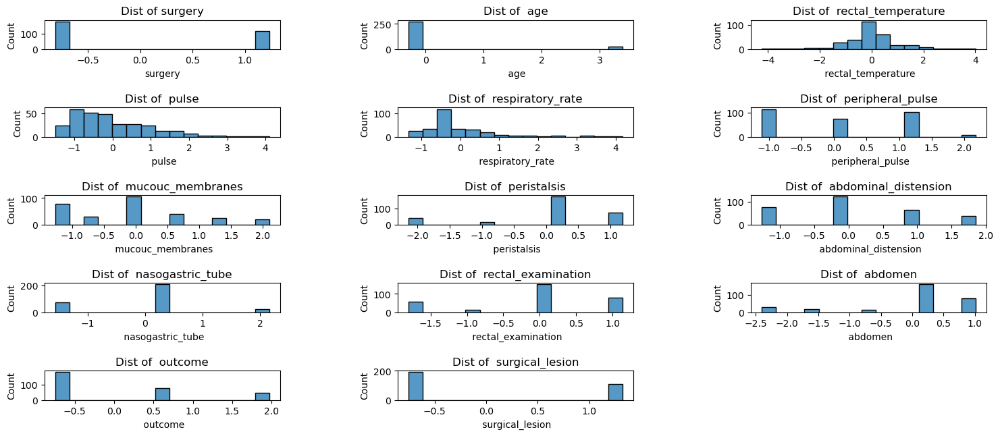

In [12]:
plt.figure(1 , figsize = (18, 9))
n = 0 
for x in data.columns:
    n += 1
    plt.subplot(6 , 3 , n)
    plt.subplots_adjust(hspace = 2, wspace = 0.5)
    sns.histplot(data[x] , bins = 15)
    plt.title('Dist of {}'.format(x))
plt.show()

**Тепловая карта** - это метод визуализации данных, который показывает величину явления в виде цвета в двух измерениях. Изменение цвета может быть связано с оттенком или интенсивностью, что дает читателю очевидные визуальные подсказки о том, как явление сгруппировано или изменяется в пространстве.

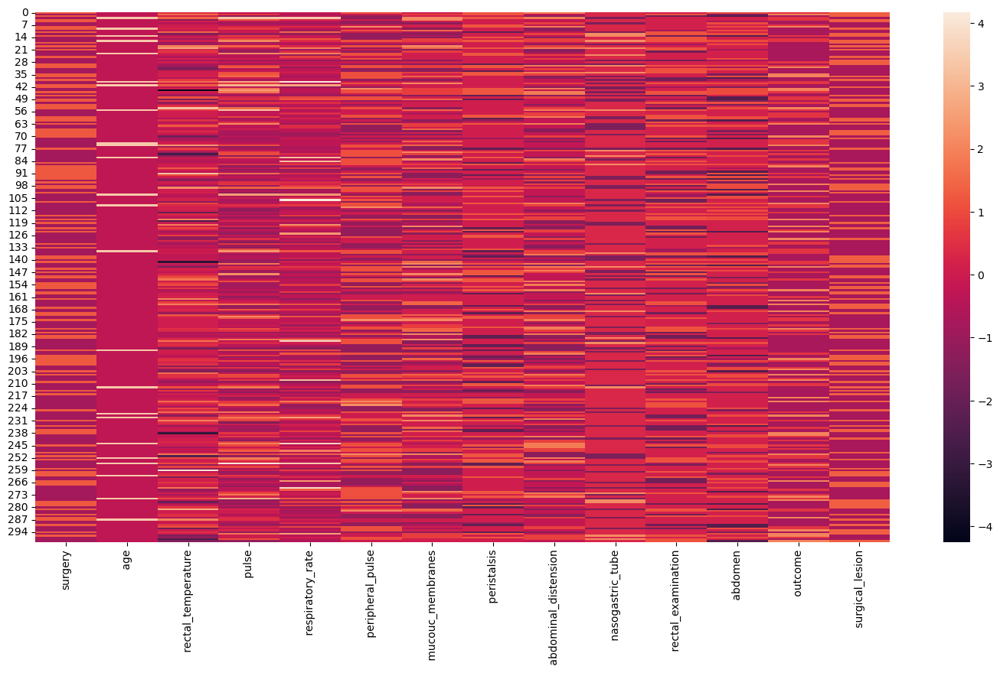

In [13]:
plt.figure(1, figsize = (18 , 9))
sns.heatmap(data)
plt.show()

Изучим нормальность и зависимость данных:

<Figure size 1800x900 with 0 Axes>

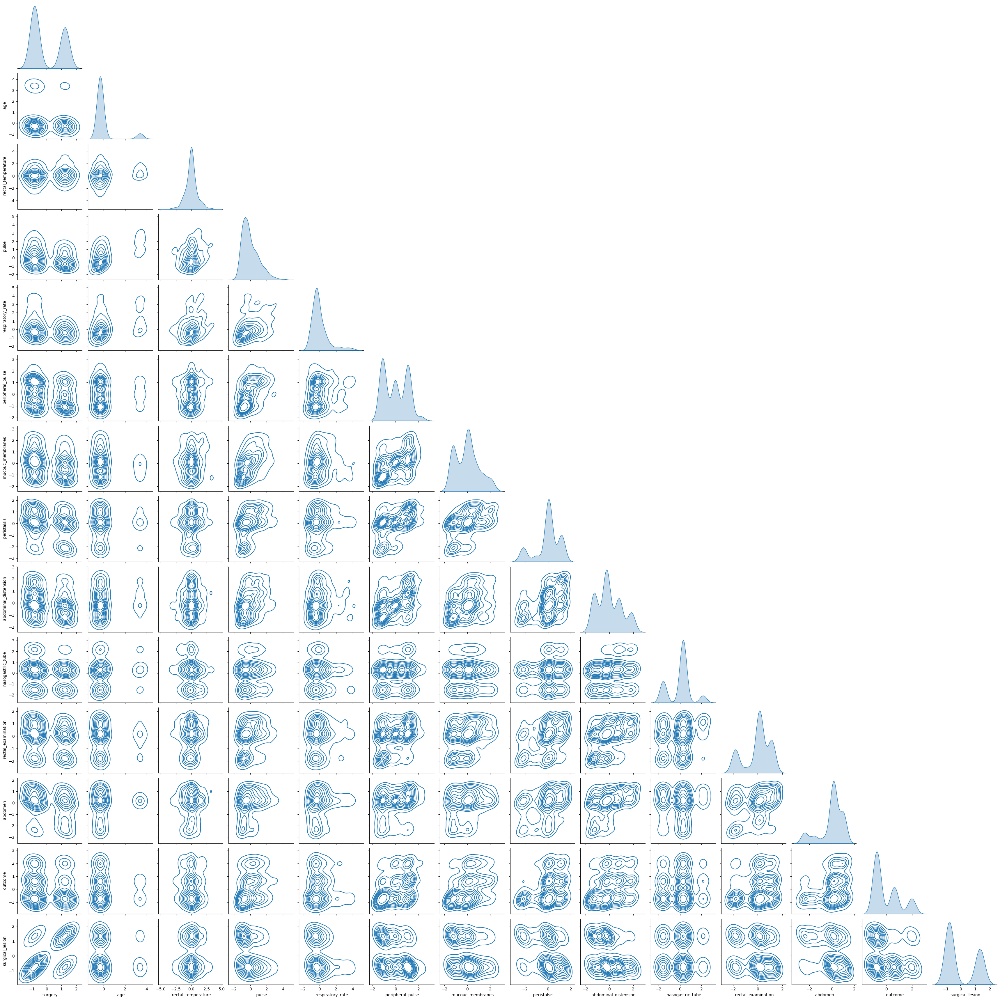

In [14]:
plt.figure(1, figsize = (18 ,9))
sns.pairplot(data, kind = 'kde', corner = True)

Данные не являются нормальными.

## Иерархический алгоритм кластеризации данных

**Агломеративная кластеризация** - это подход "снизу вверх": каждое наблюдение начинается в своем собственном кластере, и пары кластеров объединяются по мере продвижения вверх по иерархии.

**Дендрограмма** - это диаграмма, представляющая дерево. Это схематическое представление часто используется в различных контекстах: при иерархической кластеризации оно иллюстрирует расположение кластеров, полученных в результате соответствующего анализа.

Построим дендрограмму, где расстояние между кластерами вычисляется по методу Варда, а расстояние между объектами по евклидовому.

В качестве предикторов возьмем переменные отвечающие за пульс и частоту дыхания.

In [15]:
new_data = data.copy()

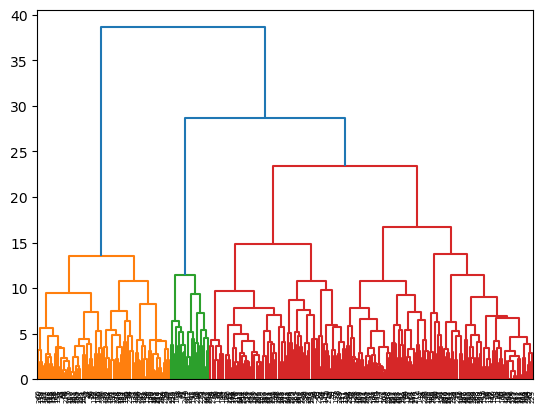

In [16]:
link = linkage(new_data, 'ward', 'euclidean')
dn = dendrogram(link)

Информацию о кластерах добавляем в таблицу данных в виде столбцa по критерию максимального количества кластеров равным 4:

In [17]:
new_data["cluster"] = fcluster(link, 4, criterion='maxclust')
new_data.groupby('cluster').mean()

,surgery,age,rectal_temperature,pulse,respiratory_rate,peripheral_pulse,mucouc_membranes,peristalsis,abdominal_distension,nasogastric_tube,rectal_examination,abdomen,outcome,surgical_lesion
cluster,,,,,,,,,,,,,,
1,1.028879,-0.294884,-0.056343,-0.691656,-0.383476,-0.740417,-0.573137,-0.768607,-0.717332,-0.167783,-0.639501,-0.920776,-0.662892,1.167804
2,-0.299806,3.391165,0.606511,1.714335,1.270624,0.076689,-0.001122,-0.107290,0.207421,0.298281,-0.169880,-0.018544,-0.011331,-0.149008
3,-0.195136,-0.294884,0.380210,0.595390,0.086541,1.080954,0.723525,0.706191,0.787410,0.073672,0.593715,0.427867,0.366157,-0.379679
4,-0.521404,-0.294884,-0.368197,-0.311760,-0.061945,-0.286074,-0.125440,0.048227,-0.114571,0.001320,0.052733,0.341541,0.202763,-0.516237


Визуализируем результаты для признаков pulse и respiratory_rate с найденным по методу Варда количеством кластеров:

Text(0.5, 0, 'Respiratory rate')

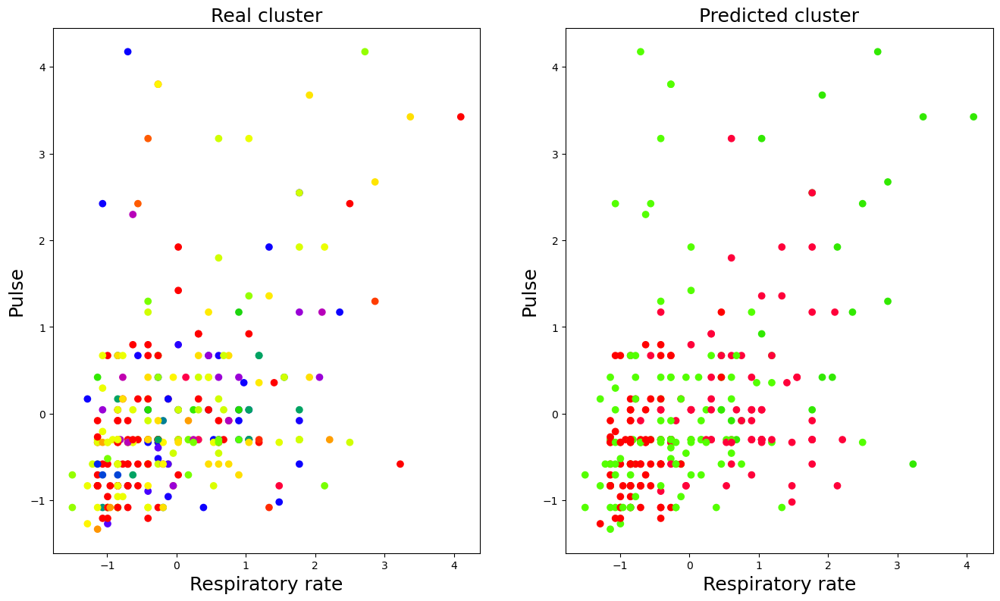

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(16,9))
axes[0].scatter(new_data.iloc[:,3], new_data.iloc[:,4], c=target.values, cmap = plt.cm.prism)
axes[0].set_title("Real cluster", fontsize = 18)
axes[0].set_ylabel("Pulse", fontsize = 18)
axes[0].set_xlabel("Respiratory rate", fontsize = 18)
axes[1].scatter(new_data.iloc[:,3], new_data.iloc[:,4], c=new_data.iloc[:,-1], cmap = plt.cm.prism)
axes[1].set_title("Predicted cluster", fontsize = 18)
axes[1].set_ylabel("Pulse", fontsize = 18)
axes[1].set_xlabel("Respiratory rate", fontsize = 18)

Оценим качество кластеризации:

In [19]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),4)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")

Скорректированный индекс Рэнда: 11.99%
Коэффициент изменения информации: 15.4%
Коэффициент качества кластеризации: 20.43%
Качество однородности: 18.4%
Качество полноты: 47.14%
Метрика V-Measure: 26.46%


Построим дендрограмму, где расстояние между кластерами вычисляется по методу полной связи, а расстояние между объектами по евклидовому.

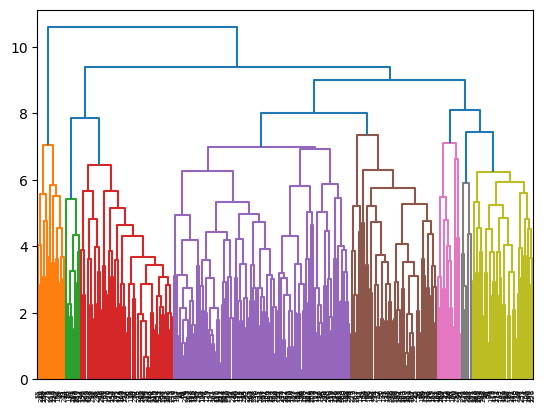

In [20]:
new_data = data.copy()
link = linkage(new_data, 'complete', 'euclidean')
dn = dendrogram(link)

Информацию о кластерах добавляем в таблицу данных в виде столбцa по критерию максимального количества кластеров равным 9:

In [21]:
new_data['cluster'] = fcluster(link, 9, criterion='maxclust')
new_data.groupby('cluster').mean()

,surgery,age,rectal_temperature,pulse,respiratory_rate,peripheral_pulse,mucouc_membranes,peristalsis,abdominal_distension,nasogastric_tube,rectal_examination,abdomen,outcome,surgical_lesion
cluster,,,,,,,,,,,,,,
1,-0.690595,3.391165,0.696116,2.242583,1.799023,0.243172,0.162170,-0.052884,0.507369,0.188619,-0.073794,0.059072,0.131979,-0.510825
2,-0.583713,-0.294884,-2.187248,0.248444,0.094120,0.594038,-0.216095,0.447660,-0.339940,-0.115998,0.265710,0.540150,0.611900,-0.755434
3,-0.263303,-0.294884,-0.209309,0.186601,-0.154512,0.767937,0.347375,0.593004,0.960558,0.731054,0.611849,0.465431,0.393365,-0.384153
4,-0.027573,-0.294884,-0.232361,-0.540770,-0.346571,-0.659658,-0.338387,-0.274986,-0.341017,-0.137293,-0.282849,0.287744,-0.226842,0.060691
5,0.649255,3.391165,0.388899,0.431446,-0.012631,-0.327625,-0.397687,-0.239422,-0.521023,0.564602,-0.403232,-0.207040,-0.359370,0.729692
6,0.966666,-0.294884,0.015984,-0.671949,-0.430550,-0.681471,-0.531442,-0.790925,-0.833443,0.055117,-0.567593,-1.719435,-0.600076,1.052545
7,-0.372810,-0.294884,1.470589,-0.077727,1.799418,0.141901,-0.493824,-0.001586,-0.076548,-0.633846,-0.053204,0.465431,-0.359370,-0.755434
8,-0.518820,-0.294884,0.498160,0.826314,-0.110942,1.237463,1.236642,0.553365,-0.372865,0.031959,0.576846,-1.307447,-0.165116,-0.755434
9,-0.147877,-0.294884,0.456818,0.817467,0.264427,1.110564,1.119718,0.737634,0.616191,-0.709424,0.554142,0.553001,0.832405,-0.193495


Визуализируем результаты для признаков pulse и respiratory_rate с найденным по методу полной связи количеством кластеров:

Text(0.5, 0, 'Respiratory rate')

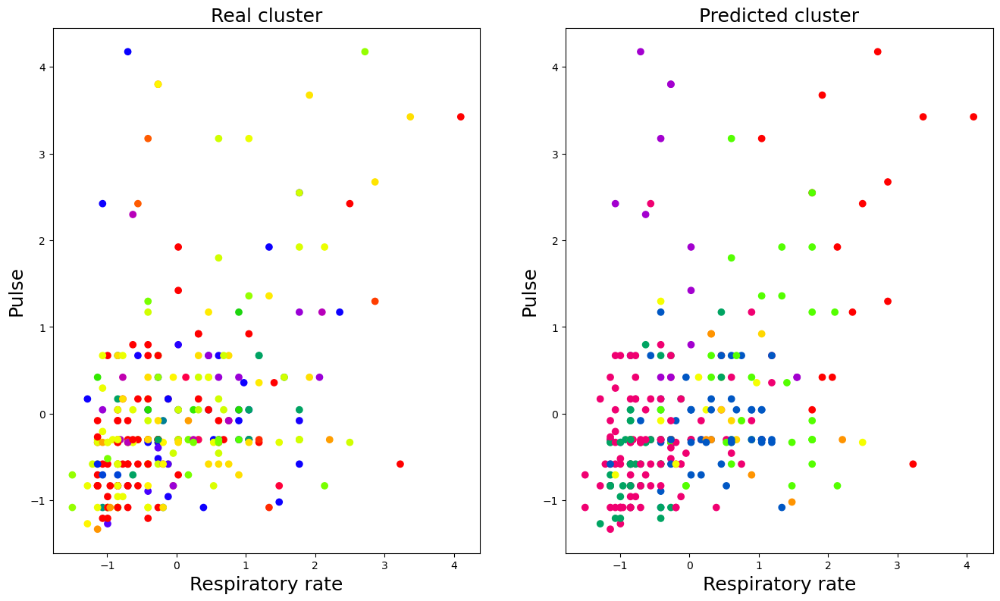

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(16,9))
axes[0].scatter(new_data.iloc[:,3], new_data.iloc[:,4], c=target.values, cmap = plt.cm.prism)
axes[0].set_title("Real cluster", fontsize = 18)
axes[0].set_ylabel("Pulse", fontsize = 18)
axes[0].set_xlabel("Respiratory rate", fontsize = 18)
axes[1].scatter(new_data.iloc[:,3], new_data.iloc[:,4], c=new_data.iloc[:,-1], cmap = plt.cm.prism)
axes[1].set_title("Predicted cluster", fontsize = 18)
axes[1].set_ylabel("Pulse", fontsize = 18)
axes[1].set_xlabel("Respiratory rate", fontsize = 18)

Оценим качество кластеризации:

In [23]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),4)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),2)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")

Скорректированный индекс Рэнда: 6.7%
Коэффициент изменения информации: 10.86%
Коэффициент качества кластеризации: 14.96%
Качество однородности: 22.8%
Качество полноты: 41.0%
Метрика V-Measure: 29.29%


Построим дендрограмму, где расстояние между кластерами вычисляется по методу средней связи, а расстояние между объектами по евклидовому.

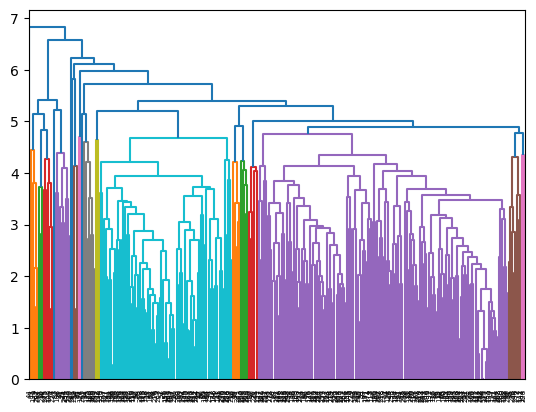

In [24]:
new_data = data.copy()
link = linkage(new_data, 'average', 'euclidean')
dn = dendrogram(link)

Информацию о кластерах добавляем в таблицу данных в виде столбцa по критерию максимального количества кластеров равным 15:

In [25]:
new_data['cluster'] = fcluster(link, 15, criterion='maxclust')
new_data.groupby('cluster').mean()

,surgery,age,rectal_temperature,pulse,respiratory_rate,peripheral_pulse,mucouc_membranes,peristalsis,abdominal_distension,nasogastric_tube,rectal_examination,abdomen,outcome,surgical_lesion
cluster,,,,,,,,,,,,,,
1,1.233292,3.391165,0.528753,0.709932,0.101767,-0.452832,-0.589961,-0.366267,-0.639549,0.671131,-0.627250,-0.353761,-0.475923,1.323742
2,-0.810838,3.391165,0.719111,1.424389,0.153206,0.472309,0.456864,0.201015,0.581932,0.298281,0.483505,0.254860,0.460814,-0.293395
3,-0.583713,3.391165,0.447171,2.378077,2.798167,0.107122,-0.365641,-0.415596,0.120996,0.298281,-0.605471,-0.125528,-0.294619,-0.755434
4,-0.810838,3.391165,1.415958,3.372175,3.423782,-1.110169,2.101875,1.187594,1.849507,-1.565973,0.156813,0.159763,0.611900,-0.755434
5,0.551915,-0.294884,3.506497,1.044531,0.545953,1.080954,-1.262919,0.077693,0.120996,0.298281,-1.149958,0.730344,1.065160,-0.755434
6,1.233292,-0.294884,2.792654,0.244403,-0.298627,1.080954,1.428916,0.077693,-1.261813,-1.565973,1.136891,-2.407854,0.611900,-0.755434
7,1.233292,-0.294884,-1.184469,-0.192031,0.295707,-0.014607,1.092436,-2.142110,0.293847,-0.633846,-1.313305,-2.407854,1.291790,0.284154
8,-0.518820,-0.294884,0.869650,-0.472595,3.012664,0.298410,-0.782234,-0.239422,-0.372865,-1.033329,0.016801,0.282030,-0.747878,-0.755434
9,1.233292,-0.294884,0.039261,-0.555725,2.422798,-1.110169,-1.262919,0.077693,-1.261813,0.298281,-1.803344,0.159763,1.971679,-0.755434


Визуализируем результаты для признаков pulse и respiratory_rate с найденным по методу средней связи количеством кластеров:

Text(0.5, 0, 'Respiratory rate')

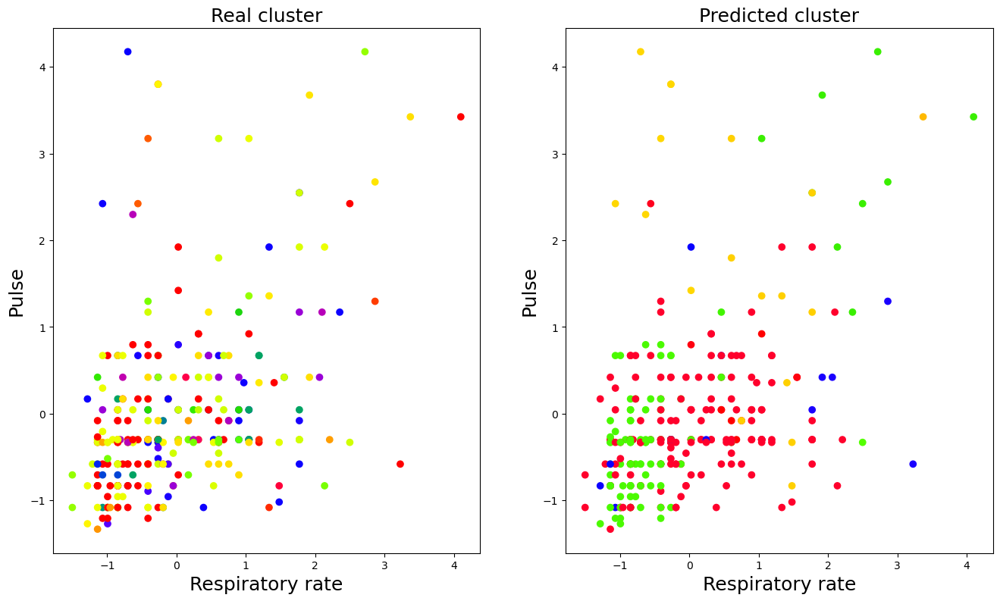

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(16,9))
axes[0].scatter(new_data.iloc[:,3], new_data.iloc[:,4], c=target.values, cmap = plt.cm.prism)
axes[0].set_title("Real cluster", fontsize = 18)
axes[0].set_ylabel("Pulse", fontsize = 18)
axes[0].set_xlabel("Respiratory rate", fontsize = 18)
axes[1].scatter(new_data.iloc[:,3], new_data.iloc[:,4], c=new_data.iloc[:,-1], cmap = plt.cm.prism)
axes[1].set_title("Predicted cluster", fontsize = 18)
axes[1].set_ylabel("Pulse", fontsize = 18)
axes[1].set_xlabel("Respiratory rate", fontsize = 18)

Оценим качество кластеризации:

In [27]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),2)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),4)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")

Скорректированный индекс Рэнда: 8.9%
Коэффициент изменения информации: 19.0%
Коэффициент качества кластеризации: 18.9%
Качество однородности: 24.9%
Качество полноты: 59.13%
Метрика V-Measure: 35.05%


## Итерационные алгоритмы кластерного анализа

Посмотрим график для сравнения оптимального количества кластеров:

In [28]:
count_clusters = np.arange(2, 23)
silh_coeffs = []

for n_clusters in count_clusters:
    model = KMeans(n_clusters = n_clusters, n_init=10)
    cluster_labels = model.fit_predict(data)
    silh_coeffs.append(silhouette_score(data, cluster_labels))

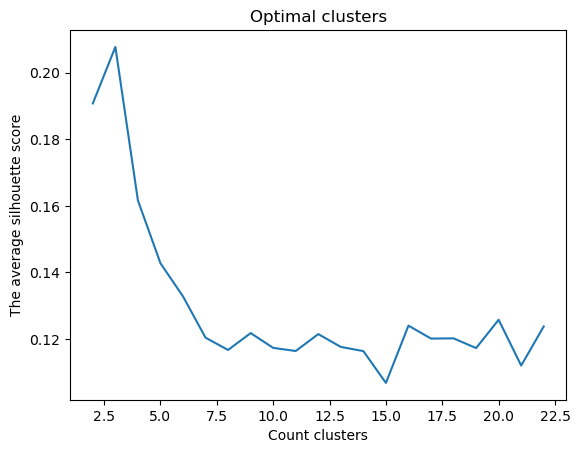

In [29]:
plt.plot(count_clusters, silh_coeffs)
plt.ylabel("The average silhouette score")
plt.xlabel("Count clusters")
plt.title("Optimal clusters")
plt.show()

Можно сделать вывод, что наиболее оптимальное количество кластеров было подобрано методом Варда и Евклидовым расстоянием, однако коэффициент Рэнда и V-метрики говорят о наиболее оптимальном количестве кластеров равным 9, которые были найдены по методу полной связи.

### Метод k-средних

**Метод k-средних** - это итеративный алгоритм кластеризации, основанный на минимизации суммарных квадратичных отклонений точек кластеров от центроидов (средних координат) этих кластеров.

Возьмем количество кластеров равное 3, как было найдено раннее.

In [30]:
new_data = data.copy()

Посмотрим оптимальное значение кластеров, используя метод elbow. Оценим количество кластеров для прогнозируемых данных от 1 до 30 и скопируем значения SSE в sse.

In [31]:
count_clusters = np.arange(1, 31)
sse = []
for n_clusters in count_clusters:
    model = KMeans(n_clusters=n_clusters, n_init=10)
    model.fit(new_data[[" pulse", " respiratory_rate"]])
    sse.append(model.inertia_)

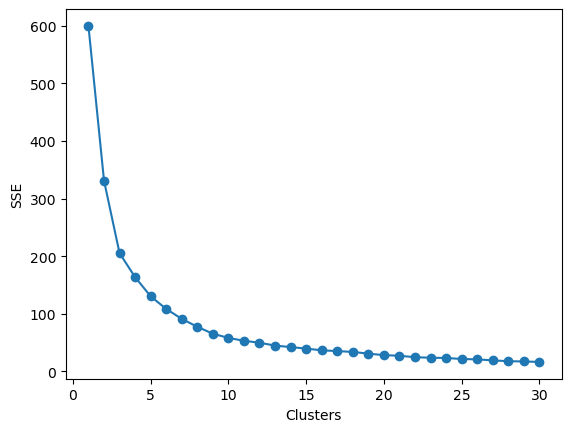

In [32]:
plt.xlabel('Clusters')
plt.ylabel('SSE')

plt.plot(count_clusters, sse)
plt.scatter(count_clusters, sse)

Описываем модель и провдим моделирование для трех кластеров:

In [33]:
model = KMeans(n_clusters=3, n_init = 10)
model.fit(new_data)

KMeans(n_clusters=3, n_init=10)

Делаем прогноз:

In [34]:
prediction = model.predict(new_data)
prediction[:10]

array([1, 1, 2, 0, 1, 2, 1, 1, 1, 0])

Подготавливаем данные для графика:

In [35]:
new_data["cluster"] = prediction

In [36]:
data0=new_data[new_data.cluster==0]
data1=new_data[new_data.cluster==1]
data2=new_data[new_data.cluster==2]

Строим график для признаков пульса и частотой дыхания:

Text(0.5, 0, 'Respiratory rate')

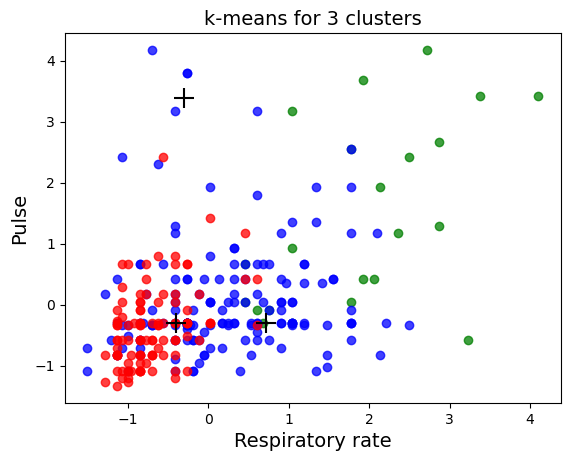

In [37]:
plt.scatter(data0[" pulse"],data0[" respiratory_rate"],color='green', alpha=0.75)
plt.scatter(data1[" pulse"],data1[" respiratory_rate"],color='blue', alpha=0.75)
plt.scatter(data2[" pulse"],data2[" respiratory_rate"],color='red', alpha=0.75)
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1], s = 200, color='black',marker='+')
plt.title("k-means for 3 clusters", fontsize = 14)
plt.ylabel("Pulse", fontsize = 14)
plt.xlabel("Respiratory rate", fontsize = 14)

Оценим качество кластеризации:

In [38]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),4)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")

Скорректированный индекс Рэнда: 8.5%
Коэффициент изменения информации: 14.09%
Коэффициент качества кластеризации: 22.29%
Качество однородности: 14.17%
Качество полноты: 52.04%
Метрика V-Measure: 22.27%


Количество кластеров равное 3 является оптимальным на первый взгляд, но методы оценки кластеризации говорят об обратном, поэтому для чистоты эксперимента имеет смысл проверить количество кластеров равное 6.

In [39]:
new_data = data.copy()
model = KMeans(n_clusters=6, n_init = 10)
model.fit(new_data)
prediction = model.predict(new_data)

Text(0.5, 0, 'Respiratory rate')

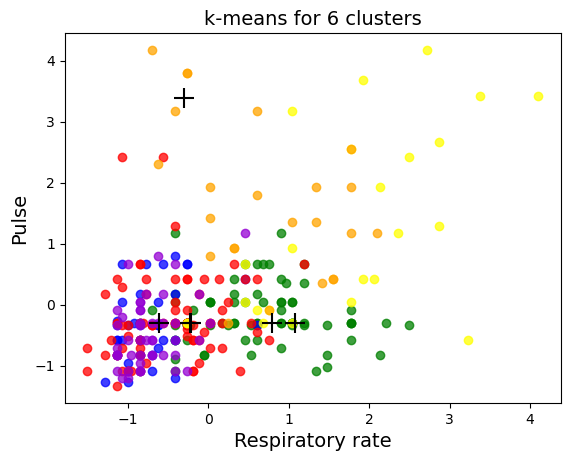

In [40]:
new_data["cluster"] = prediction

data0=new_data[new_data.cluster==0]
data1=new_data[new_data.cluster==1]
data2=new_data[new_data.cluster==2]
data3=new_data[new_data.cluster==3]
data4=new_data[new_data.cluster==4]
data5=new_data[new_data.cluster==5]

plt.scatter(data0[" pulse"],data0[" respiratory_rate"],color='green', alpha=0.75)
plt.scatter(data1[" pulse"],data1[" respiratory_rate"],color='blue', alpha=0.75)
plt.scatter(data2[" pulse"],data2[" respiratory_rate"],color='red', alpha=0.75)
plt.scatter(data3[" pulse"],data3[" respiratory_rate"],color='yellow', alpha=0.75)
plt.scatter(data4[" pulse"],data4[" respiratory_rate"],color='orange', alpha=0.75)
plt.scatter(data5[" pulse"],data5[" respiratory_rate"],color='darkviolet', alpha=0.75)
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1], s = 200, color='black',marker='+')
plt.title("k-means for 6 clusters", fontsize = 14)
plt.ylabel("Pulse", fontsize = 14)
plt.xlabel("Respiratory rate", fontsize = 14)

Оценим качество кластеризации:

In [41]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),2)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),3)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")

Скорректированный индекс Рэнда: 10.43%
Коэффициент изменения информации: 17.0%
Коэффициент качества кластеризации: 22.7%
Качество однородности: 24.099999999999998%
Качество полноты: 47.12%
Метрика V-Measure: 31.900000000000002%


### Fuzzy C-Means алгоритм кластеризации

**The Algorithm Fuzzy c-means (FCM)** - это метод кластеризации, который позволяет одному фрагменту данных принадлежать двум или более кластерам.

In [42]:
new_data = data.copy()

Обучим модель нечеткой кластеризации с количеством кластеров равынм 6:

In [43]:
model = FCM(n_clusters = 6)
model.fit(new_data.values)
center = model.centers

Спрогнозируем значения:

In [44]:
prediction = model.predict(data.values)
prediction[:10]

array([0, 0, 4, 0, 0, 4, 5, 0, 0, 4], dtype=int64)

Text(0.5, 0, 'Respiratory rate')

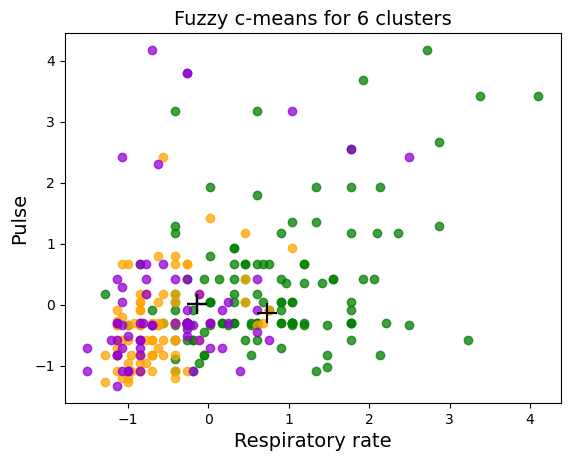

In [45]:
new_data["cluster"] = prediction

data0=new_data[new_data.cluster==0]
data1=new_data[new_data.cluster==1]
data2=new_data[new_data.cluster==2]
data3=new_data[new_data.cluster==3]
data4=new_data[new_data.cluster==4]
data5=new_data[new_data.cluster==5]

plt.scatter(data0[" pulse"],data0[" respiratory_rate"],color='green', alpha=0.75)
plt.scatter(data1[" pulse"],data1[" respiratory_rate"],color='blue', alpha=0.75)
plt.scatter(data2[" pulse"],data2[" respiratory_rate"],color='red', alpha=0.75)
plt.scatter(data3[" pulse"],data3[" respiratory_rate"],color='yellow', alpha=0.75)
plt.scatter(data4[" pulse"],data4[" respiratory_rate"],color='orange', alpha=0.75)
plt.scatter(data5[" pulse"],data5[" respiratory_rate"],color='darkviolet', alpha=0.75)
plt.scatter(center[:,0],center[:,1], s = 200, color='black',marker='+')
plt.title("Fuzzy c-means for 6 clusters", fontsize = 14)
plt.ylabel("Pulse", fontsize = 14)
plt.xlabel("Respiratory rate", fontsize = 14)

Оценим качество кластеризации:

In [46]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),3)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")

Скорректированный индекс Рэнда: 12.7%
Коэффициент изменения информации: 16.38%
Коэффициент качества кластеризации: 25.8%
Качество однородности: 16.66%
Качество полноты: 51.41%
Метрика V-Measure: 25.16%


### Метод кластеризации на основе плотности DBSCAN

**DBSCAN (Density-Based Spatial Clustering of Applications with Noise, плотностной алгоритм пространственной кластеризации с присутствием шума)** – популярный алгоритм кластеризации, используемый в анализе данных в качестве одной из замен метода k-средних.

Метод не требует предварительных предположений о числе кластеров, но нужно настроить два других параметра: eps и min_samples. Данные параметры – это соответственно максимальное расстояние между соседними точками и минимальное число точек в окрестности (количество соседей), когда можно говорить, что эти экземпляры данных образуют один кластер.

In [47]:
new_data = data.copy()

Исследуем данные для оптимального определения значения эпсилон для дальнейшей кластеризации:

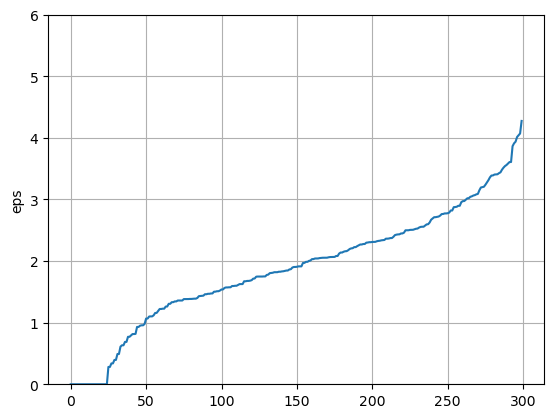

In [48]:
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors = 3)
neighbors_fit = neighbors.fit(data)
distances, indices = neighbors_fit.kneighbors(data)

distances = np.sort(distances, axis = 0)
distances = distances[:,1]
plt.ylim(0, 6)
plt.plot(distances)
plt.ylabel('eps')
plt.grid()

Обучим модель:

In [49]:
model = DBSCAN(eps = 2.7, min_samples = 3)
model.fit_predict(new_data)[:10]

array([ 0, -1,  0, -1, -1,  0,  0,  0,  0,  1], dtype=int64)

Визуальный анализ и сравнение результатов кластеризации:

In [50]:
final_data = target.copy()

In [51]:
DBSCAN_method = pd.DataFrame(model.labels_)

final_data["DBSCAN"] = DBSCAN_method
final_data.head(5)

,first_type_of_lesion,DBSCAN
0,56.0,0
1,14.0,-1
2,1.0,0
3,14.0,-1
4,37.0,-1


In [52]:
db = model.fit(new_data)
labels = db.labels_

In [53]:
comp = PCA(n_components = 2).fit_transform(new_data)
dff = pd.DataFrame(comp, columns = ["pulse", "respiratory_rate"])
final_data = final_data.join(dff)
final_data.head(5)

,first_type_of_lesion,DBSCAN,pulse,respiratory_rate
0,56.0,0,-1.135175,-0.612257
1,14.0,-1,-0.909673,0.030850
2,1.0,0,3.315544,0.484955
3,14.0,-1,-4.014631,4.916979
4,37.0,-1,-0.467603,-0.007187


Text(0.5, 1.0, 'DBSCAN')

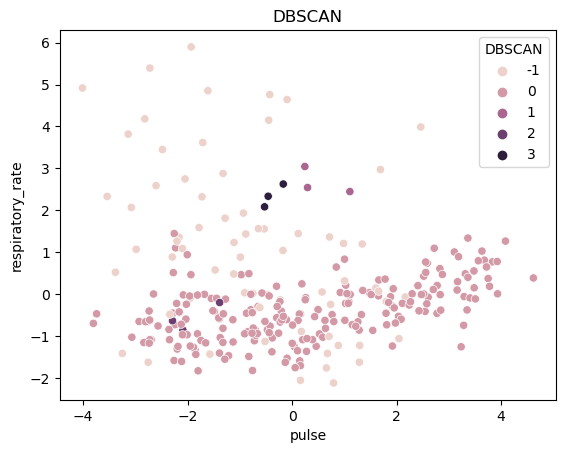

In [54]:
sns.scatterplot(x = final_data["pulse"], y = final_data["respiratory_rate"], hue = final_data["DBSCAN"], data = final_data)
plt.title("DBSCAN")

In [55]:
px.scatter(final_data, x = "pulse", y = "respiratory_rate", color = "DBSCAN", title = 'DBSCAN Clustering')

Оценим кластеризацию:

In [56]:
print("Число кластеров: " + str(len(set(labels))-(1 if -1 in labels else 0)))
print("Количество шума: " + str(list(labels).count(-1)))
print("Скорректированный индекс Рэнда: " + str(np.round(adjusted_rand_score(final_data[" first_type_of_lesion"], final_data["DBSCAN"]),2)*100) + "%")
print("Коэффициент изменения информации: " + str(np.round(adjusted_mutual_info_score(final_data[" first_type_of_lesion"], final_data["DBSCAN"]),4)*100) + "%") 
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),4)*100}%")
print("Качество однородности: " + str(np.round(homogeneity_score(final_data[" first_type_of_lesion"], final_data["DBSCAN"]),4)*100) + "%")
print("Качество полноты: " + str(np.round(completeness_score(final_data[" first_type_of_lesion"], final_data["DBSCAN"]),4)*100) + "%")
print("Метрика V-Measure: " + str(np.round(v_measure_score(final_data[" first_type_of_lesion"], final_data["DBSCAN"]),4)*100) + "%")

Число кластеров: 4
Количество шума: 69
Скорректированный индекс Рэнда: 3.0%
Коэффициент изменения информации: 5.54%
Коэффициент качества кластеризации: 16.0%
Качество однородности: 8.7%
Качество полноты: 40.75%
Метрика V-Measure: 14.34%


### t-SNE метод понижения размерности

**Метод t-SNE (t-distributed stochastic neighbor embedding)** представляет собой один из методов обучения без учителя, используемых для визуализации, например, отображения пространства высокой размерности в двух- или трехмерное пространство. t-SNE расшифровывается как распределенное стохастическое соседнее вложение.

Метод моделирует каждый объект пространства высокой размерности в двух- или трехкоординатную точку таким образом, что близкие по характеристикам элементы данных в многомерном пространстве (например, датасете с большим числом столбцов) проецируются в соседние точки, а разнородные объекты с большей вероятностью моделируются точками, далеко отстоящими друг от друга. 

In [57]:
new_data = data.copy()

Определяем модель и задаем скорость обучения:

In [58]:
model = TSNE(perplexity=10, learning_rate=200, n_iter=5000)
transformed = model.fit_transform(new_data)

Визуализируем данные:

In [59]:
umap_data = pd.DataFrame(transformed, columns = ["Dimension_1", "Dimension_2"])
umap_data["target"] = target

In [60]:
px.scatter(umap_data, x = "Dimension_1", y = "Dimension_2", color = "target", title = 't-SNE')

Получаем параметры модели:

In [61]:
print(f"Расхождение Кулбека-Лейблера после оптимизации: {np.round(model.kl_divergence_, 3)*100}%")

Расхождение Кулбека-Лейблера после оптимизации: 71.7%


### Uniform Manifold Approximation and Projection (UMAP)

**Uniform Manifold Approximation and Projection (UMAP)** — алгоритм машинного обучения, выполняющий нелинейное снижение размерности.

In [62]:
new_data = data.copy()

Обучаем модель:

In [63]:
model = UMAP(random_state=3)
transformed = model.fit_transform(new_data, target)

Трансформируем данные:

In [64]:
umap_data = pd.DataFrame(transformed, columns = ["Dimension_1", "Dimension_2"])
umap_data["target"] = target

Визуализируем результат:

In [65]:
px.scatter(umap_data, x = "Dimension_1", y = "Dimension_2", color = "target", title = 'UMAP')

## Повторный анализ

Анализ полученных данных:

На основе данных со сниженной размерностью, проведем повторный кластерный анализ на основе итерационного алгоритма с нечеткими центроидами fuzzy c-means.

Разделим данные и удалим информацию о целевой переменной из транфсормированных данных:

In [66]:
new_data = umap_data.drop(umap_data.columns[-1], axis=1)
predicted_data = new_data.copy()

#### Fuzzy c-means

Построим модель нечетких центроидов с количеством кластеров равным 11:

In [67]:
model = FCM(n_clusters = 11)
model.fit(new_data.values)
center = model.centers

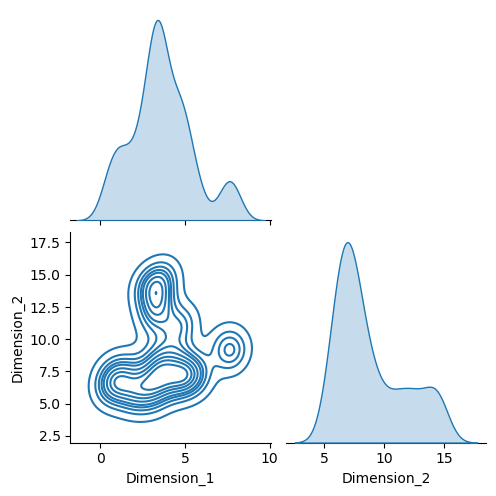

In [68]:
sns.pairplot(new_data, kind = 'kde', corner = True)

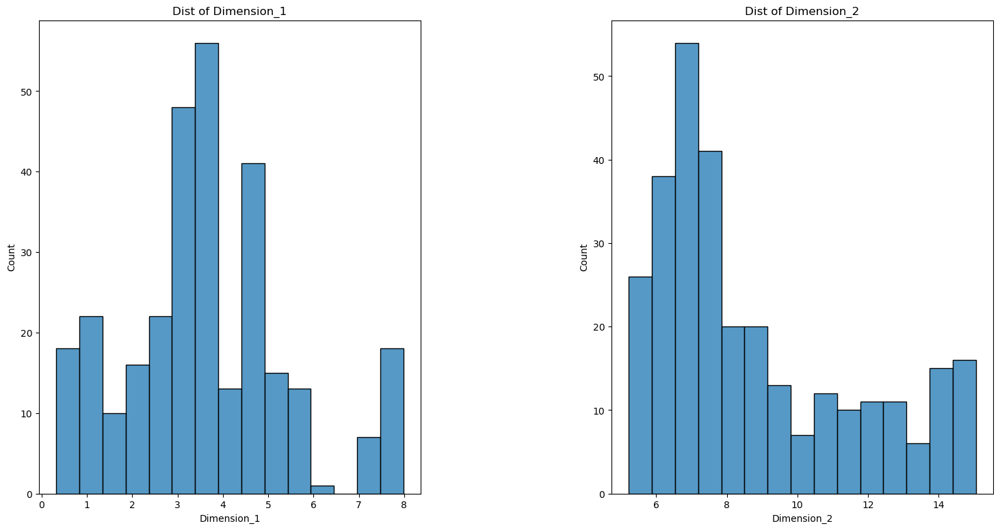

In [69]:
plt.figure(1 , figsize = (18, 9))
n = 0 
for x in new_data.columns:
    n += 1
    plt.subplot(1 , 2 , n)
    plt.subplots_adjust(hspace = 2, wspace = 0.5)
    sns.histplot(new_data[x] , bins = 15)
    plt.title('Dist of {}'.format(x))
plt.show()

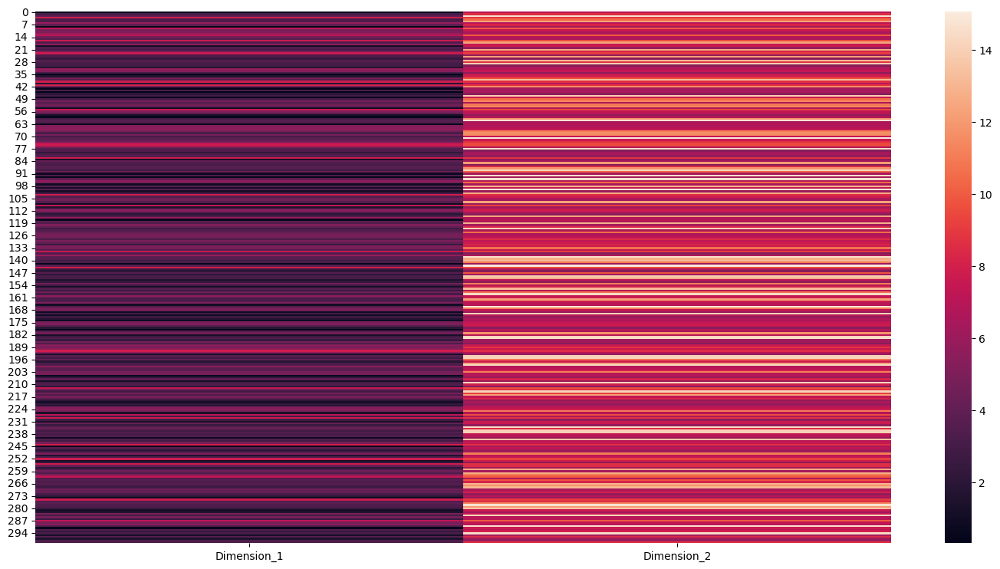

In [70]:
plt.figure(1, figsize = (18 , 9))
sns.heatmap(new_data)
plt.show()

Оценим данные:

In [71]:
prediction = model.predict(predicted_data.values)
new_data["cluster"] = prediction
new_data.groupby("cluster").mean()

,Dimension_1,Dimension_2
cluster,,
0,1.332567,7.397972
1,3.782455,8.189824
2,3.331737,12.537333
3,3.575795,10.493878
4,7.616313,9.212461
5,4.678091,11.011384
6,3.381557,6.718484
7,3.273615,14.372331
8,5.130397,7.117776


Разделим значения для точечного анализа:

In [72]:
data0=new_data[new_data.cluster==0]
data1=new_data[new_data.cluster==1]
data2=new_data[new_data.cluster==2]
data3=new_data[new_data.cluster==3]
data4=new_data[new_data.cluster==4]
data5=new_data[new_data.cluster==5]
data6=new_data[new_data.cluster==6]
data7=new_data[new_data.cluster==7]
data8=new_data[new_data.cluster==8]
data9=new_data[new_data.cluster==9]
data10=new_data[new_data.cluster==10]

Построим точечный график для полученных кластеров:

Text(0.5, 1.0, 'Fuzzy c-means for 11 clusters')

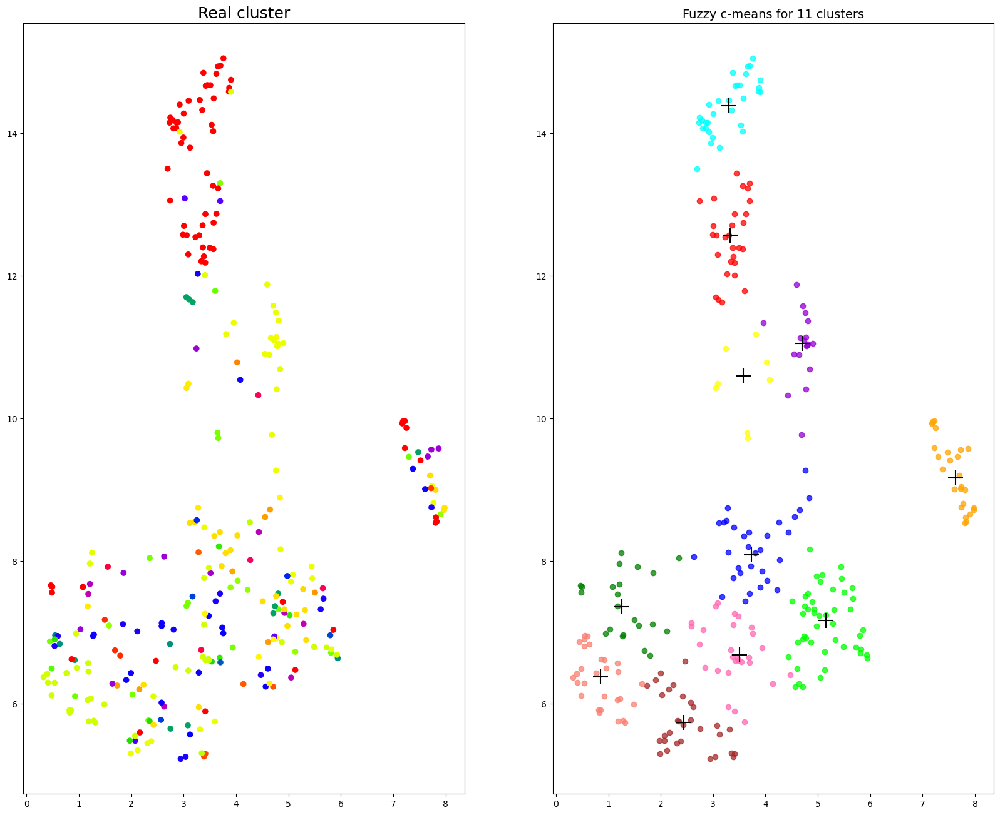

In [73]:
fig, axes = plt.subplots(1, 2, figsize=(20,16))

axes[0].scatter(new_data.iloc[:,0], new_data.iloc[:,1], c=target.values, cmap = plt.cm.prism)
axes[0].set_title("Real cluster", fontsize = 18)

axes[1].scatter(data0["Dimension_1"],data0["Dimension_2"],color='green', alpha=0.75)
axes[1].scatter(data1["Dimension_1"],data1["Dimension_2"],color='blue', alpha=0.75)
axes[1].scatter(data2["Dimension_1"],data2["Dimension_2"],color='red', alpha=0.75)
axes[1].scatter(data3["Dimension_1"],data3["Dimension_2"],color='yellow', alpha=0.75)
axes[1].scatter(data4["Dimension_1"],data4["Dimension_2"],color='orange', alpha=0.75)
axes[1].scatter(data5["Dimension_1"],data5["Dimension_2"],color='darkviolet', alpha=0.75)
axes[1].scatter(data6["Dimension_1"],data6["Dimension_2"],color='hotpink', alpha=0.75)
axes[1].scatter(data7["Dimension_1"],data7["Dimension_2"],color='aqua', alpha=0.75)
axes[1].scatter(data8["Dimension_1"],data8["Dimension_2"],color='lime', alpha=0.75)
axes[1].scatter(data9["Dimension_1"],data9["Dimension_2"],color='brown', alpha=0.75)
axes[1].scatter(data10["Dimension_1"],data10["Dimension_2"],color='salmon', alpha=0.75)
axes[1].set_title("Predicted cluster", fontsize = 18)

plt.scatter(center[:,0],center[:,1], s = 300, color='black',marker='+')

plt.title("Fuzzy c-means for 11 clusters", fontsize = 14)

Оценим кластеризацию:

In [74]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),2)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),2)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),2)*100}%")

Скорректированный индекс Рэнда: 22.09%
Коэффициент изменения информации: 26.8%
Коэффициент качества кластеризации: 71.0%
Качество однородности: 38.79%
Качество полноты: 54.0%
Метрика V-Measure: 45.0%


#### Hierarchic algorithm by method Ward

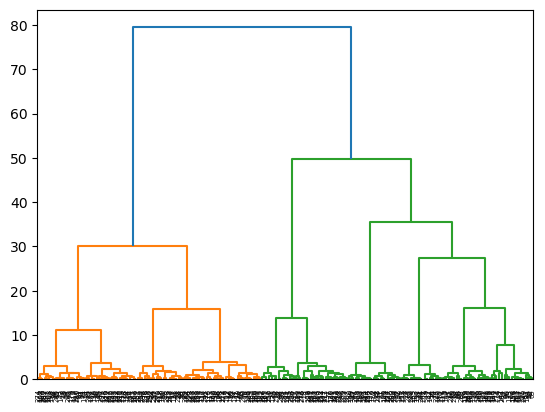

In [75]:
link = linkage(new_data, 'ward', 'euclidean')
dn = dendrogram(link)

In [76]:
new_data["cluster"] = fcluster(link, 2, criterion='maxclust')
new_data.groupby('cluster').mean()

,Dimension_1,Dimension_2
cluster,,
1,3.241350,6.552176
2,3.946476,10.621846


Text(0.5, 0, 'Respiratory rate')

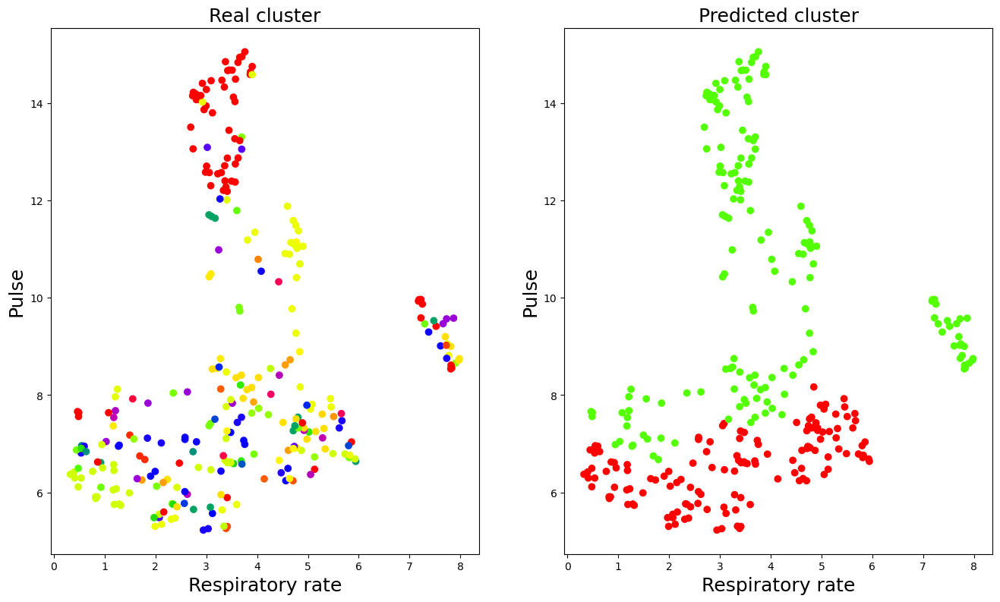

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(16,9))
axes[0].scatter(new_data.iloc[:,0], new_data.iloc[:,1], c=target.values, cmap = plt.cm.prism)
axes[0].set_title("Real cluster", fontsize = 18)
axes[0].set_ylabel("Pulse", fontsize = 18)
axes[0].set_xlabel("Respiratory rate", fontsize = 18)
axes[1].scatter(new_data.iloc[:,0], new_data.iloc[:,1], c=new_data.iloc[:,-1], cmap = plt.cm.prism)
axes[1].set_title("Predicted cluster", fontsize = 18)
axes[1].set_ylabel("Pulse", fontsize = 18)
axes[1].set_xlabel("Respiratory rate", fontsize = 18)

In [78]:
print(f"Скорректированный индекс Рэнда: {np.round(adjusted_rand_score(target.values[:,0], new_data.iloc[:,-1]),2)*100}%")
print(f"Коэффициент изменения информации: {np.round(adjusted_mutual_info_score(target.values[:,0], new_data.iloc[:,-1]),3)*100}%")
print(f"Коэффициент качества кластеризации: {np.round(silhouette_score(new_data, new_data.iloc[:,-1]),2)*100}%")
print(f"Качество однородности: {np.round(homogeneity_score(target.values[:,0], new_data.iloc[:,-1]),4)*100}%")
print(f"Качество полноты: {np.round(completeness_score(target.values[:,0], new_data.iloc[:,-1]),2)*100}%")
print(f"Метрика V-Measure: {np.round(v_measure_score(target.values[:,0], new_data.iloc[:,-1]),1)*100}%")

Скорректированный индекс Рэнда: 8.0%
Коэффициент изменения информации: 12.3%
Коэффициент качества кластеризации: 34.0%
Качество однородности: 10.91%
Качество полноты: 52.0%
Метрика V-Measure: 20.0%


После изменения размерности данных и подбора наиболее эффективного алгоритма обучения без учителя, которым оказался нечеткий анализ к-средних, были получены кластеры, которые на фоне остальных методов описываются лучшим образом, позволяя по определенному набору предикторов правильно категоризировать тип заболевания лошади (целевая переменная).